# A Quick Overview on Geospatial Data Visualization using PyGMT
```
Utpal Kumar, Feb 2022
```

## Install new environment with necessary libraries

## First way (only needs python3 installation)
```
python -m venv geoviz
source geoviz/bin/activate
pip install pygmt scipy #requires GMT installation for execution
```

## Recommended Way
- Install [Miniconda](https://docs.conda.io/en/latest/miniconda.html) [Light-version of Anaconda]
- Create environment (it's always a good idea to keep separate environment for different projects)

```
conda create --name geoviz --channel conda-forge pandas pygmt scipy jupyter notebook
```

## Contents
1. Plotting a topographic map
1. Plotting data points on a topographic map
1. Plotting focal mechanism on a map
    1. Using Strike, Dip, and Rake (in Harvard CMT convention)
    1. Using Seismic moment tensor
1. Plot tomographic results on a geographical map

## Import libraries

In [1]:
import pygmt
import pandas as pd
import numpy as np
import xarray as xr
from scipy.interpolate import griddata

## 1. Plotting a topographic map

In [2]:
#define etopo data file
# topo_data = 'path_to_local_data_file'
topo_data = '@earth_relief_30s' #30 arc second global relief (SRTM15+V2.1 @ 1.0 km)
# topo_data = '@earth_relief_15s' #15 arc second global relief (SRTM15+V2.1)
# topo_data = '@earth_relief_03s' #3 arc second global relief (SRTM3S)

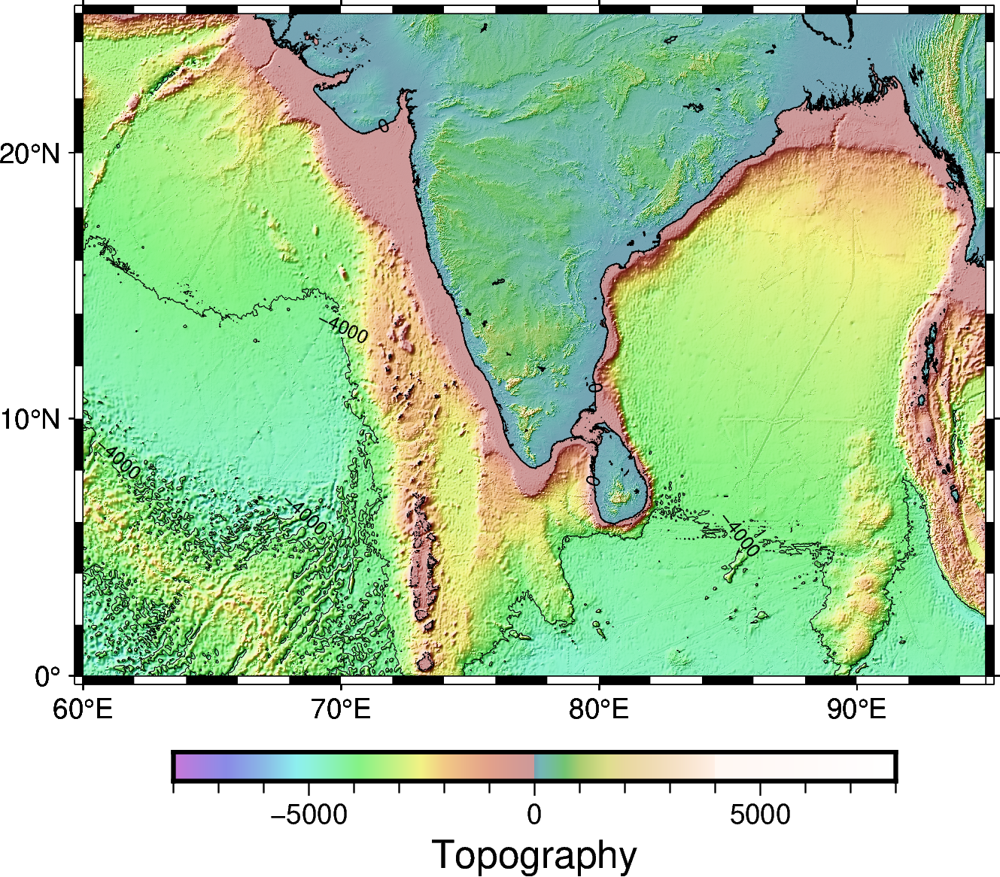

In [3]:
# define plot geographical range
minlon, maxlon = 60, 95
minlat, maxlat = 0, 25

# Visualization
fig = pygmt.Figure()

# make color pallets
pygmt.makecpt(
    cmap='topo',
    series='-8000/8000/1000',
    continuous=True
)

# plot high res topography
fig.grdimage(
    grid=topo_data,
    region=[minlon, maxlon, minlat, maxlat],
    projection='M4i',
    shading=True,
    frame=True
    )

# plot continents, shorelines, rivers, and borders
fig.coast(
    region=[minlon, maxlon, minlat, maxlat],
    projection='M4i',
    shorelines=True,
    frame=True
    )

# plot the topographic contour lines
fig.grdcontour(
    grid=topo_data,
    interval=4000,
    annotation="4000+f6p",
    limit="-8000/0", #to only display it below 
    pen="a0.15p"
    )

# Plot colorbar
fig.colorbar(
    frame='+l"Topography"',
#     position="x11.5c/6.6c+w6c+jTC+v" #for vertical colorbar
    )

# save figure
save_fig = 0
if not save_fig:
    fig.show() 
    #fig.show(method='external') #open with the default pdf reader
else:
    fig.savefig("topo-plot.png", crop=True, dpi=300, transparent=True)
#     fig.savefig("topo-plot.pdf", crop=True, dpi=720)
    print('Figure saved!')

## 2. Plotting data points on a topographic map
We plot 10 randomly generated coordinates on a topographic map with red circles. More symbol options can be found at the [GMT site](https://docs.generic-mapping-tools.org/dev/cookbook/custom-symbols.html#macro-commands).

In [4]:
## Generate fake coordinates in the range for plotting
lons = minlon + np.random.rand(10)*(maxlon-minlon)
lats = minlat + np.random.rand(10)*(maxlat-minlat)

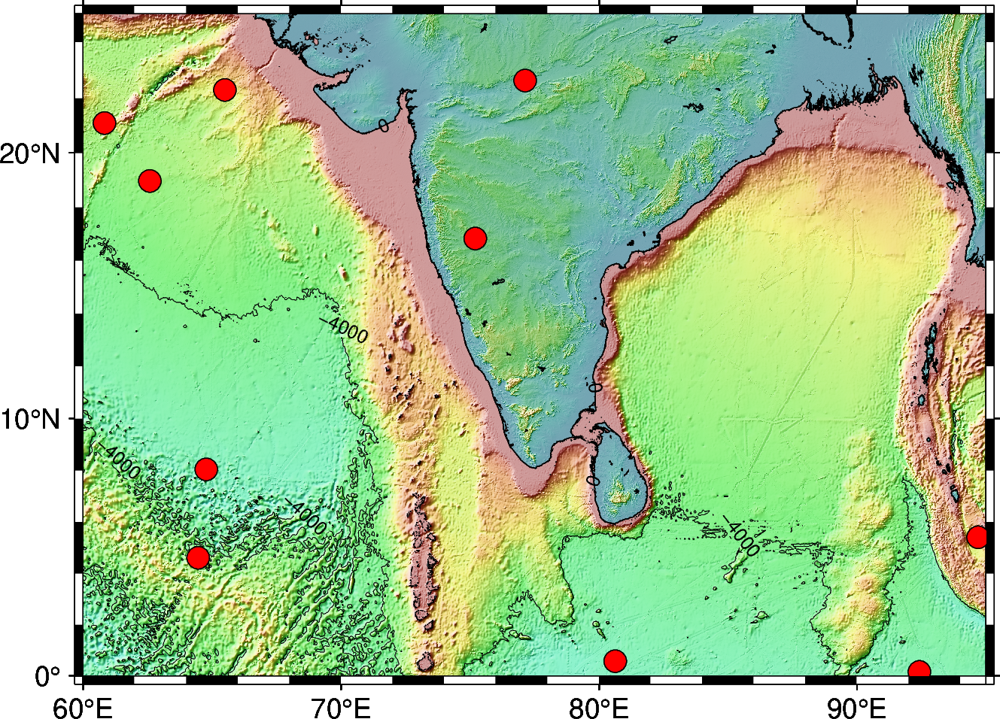

In [5]:
# define plot geographical range
minlon, maxlon = 60, 95
minlat, maxlat = 0, 25

# Visualization
fig = pygmt.Figure()

# make color pallets
pygmt.makecpt(
    cmap='topo',
    series='-8000/8000/1000',
    continuous=True
)

# plot high res topography
fig.grdimage(
    grid=topo_data,
    region=[minlon, maxlon, minlat, maxlat],
    projection='M4i',
    shading=True,
    frame=True
    )

# plot continents, shorelines, rivers, and borders
fig.coast(
    region=[minlon, maxlon, minlat, maxlat],
    projection='M4i',
    shorelines=True,
    frame=True
    )

# plot the topographic contour lines
fig.grdcontour(
    grid=topo_data,
    interval=4000,
    annotation="4000+f6p",
    limit="-8000/0", #to only display it only for the regions below the shorelines
    pen="a0.15p"
    )

# plot data points
fig.plot(
    x=lons,
    y=lats,
    style='c0.1i',
    color='red',
    pen='black',
    label='something',
    )

# save figure
fig.show() 
#fig.show(method='external') #open with the default pdf reader

## 3. Plotting focal mechanism on a map

### Focal mechanisms in Harvard CMT convention
Using strike, dip, rake and magnitude

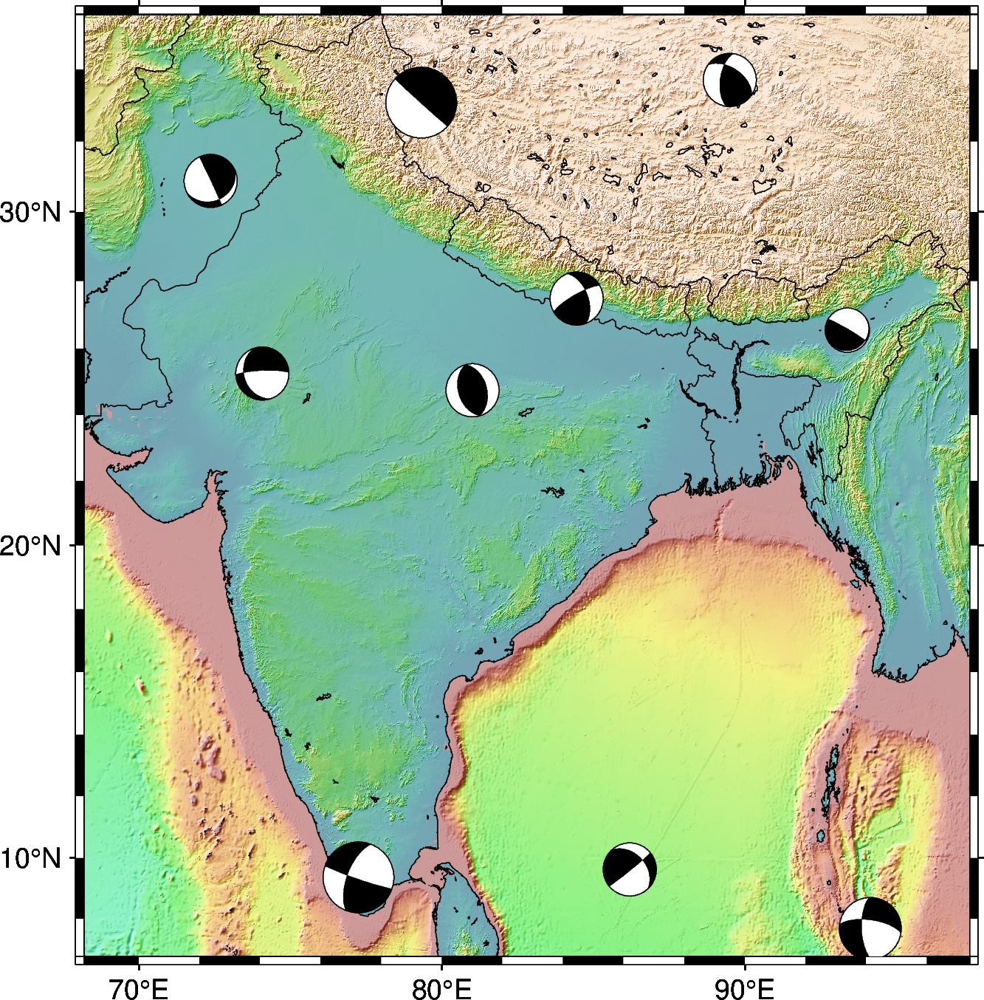

In [6]:
minlon, maxlon = 70, 100
minlat, maxlat = 0, 35

## Generate fake coordinates in the range for plotting
num_fm = 15
lons = minlon + np.random.rand(num_fm)*(maxlon-minlon)
lats = minlat + np.random.rand(num_fm)*(maxlat-minlat)

strikes = np.random.randint(low = 0, high = 360, size = num_fm)
dips = np.random.randint(low = 0, high = 90, size = num_fm)
rakes = np.random.randint(low = 0, high = 360, size = num_fm)
magnitudes = np.random.randint(low = 5, high = 9, size = num_fm)


fig = pygmt.Figure()

# make color pallets
pygmt.makecpt(
    cmap='topo',
    series='-8000/11000/1000',
    continuous=True
)

#plot high res topography
fig.grdimage(
    grid=topo_data,
    region='IN', 
    projection='M4i',
    shading=True,
    frame=True
    )

fig.coast( region='IN',
    projection='M4i',
    frame=True,
    shorelines=True,
    borders=1, #political boundary
)

for lon, lat, st, dp, rk, mg in zip(lons, lats, strikes, dips, rakes, magnitudes):
    with pygmt.helpers.GMTTempFile() as temp_file: 
        with open(temp_file.name, 'w') as f:
            f.write(f'{lon} {lat} 0 {st} {dp} {rk} {mg} 0 0') #moment tensor: lon, lat, depth, strike, dip, rake, magnitude
        with pygmt.clib.Session() as session:
            session.call_module('meca', f'{temp_file.name} -Sa0.2i')

fig.show() 

### Focal mechanisms for Seismic moment tensor (Harvard CMT, with zero trace)
This example script needs formatted GCMT soln. Download the file from [here](https://drive.google.com/file/d/137WD2sI1UlCbsfJKzxTdmuIkXv8s-Ybw/view?usp=sharing)

In [7]:
# Define geographical range
minlon, maxlon = -180, -20
minlat, maxlat = 0, 90


## Read GCMT sol
df_gcmt = pd.read_csv('gcmt_sol2.csv')

# ## Subset the data for the given geographical range (will make the program a bit faster to process)
# df_gcmt = df_gcmt[(df_gcmt['evlon'] >= minlon) & (df_gcmt['evlon'] <= maxlon) \
#                   & (df_gcmt['evlat'] >= minlat) & (df_gcmt['evlat'] <= maxlat)]
df_gcmt = df_gcmt[['evmag', 'evlat', 'evlon', 'evdep', 'm_rr','m_tt', 'm_pp', 'm_rt', 'm_rp', 'm_tp']]
df_gcmt.head()

,evmag,evlat,evlon,evdep,m_rr,m_tt,m_pp,m_rt,m_rp,m_tp
0,7.47,15.14,-89.78,16.3,-3.500000e+26,-7.800000e+26,1.120000e+27,3.800000e+26,-4.700000e+26,1.670000e+27
1,5.97,51.63,-130.93,22.5,-1.700000e+24,-1.600000e+24,3.300000e+24,1.800000e+24,-1.600000e+24,1.080000e+25
2,6.60,3.87,-85.80,17.5,-1.580000e+25,7.130000e+25,-5.550000e+25,-2.110000e+25,-1.500000e+24,7.460000e+25
3,6.63,0.79,-79.89,19.4,5.880000e+25,1.900000e+24,-6.070000e+25,3.750000e+25,-8.540000e+25,-1.480000e+25
4,6.42,17.22,-100.91,29.0,3.200000e+25,-2.730000e+25,-4.700000e+24,3.880000e+25,-1.970000e+25,1.130000e+25


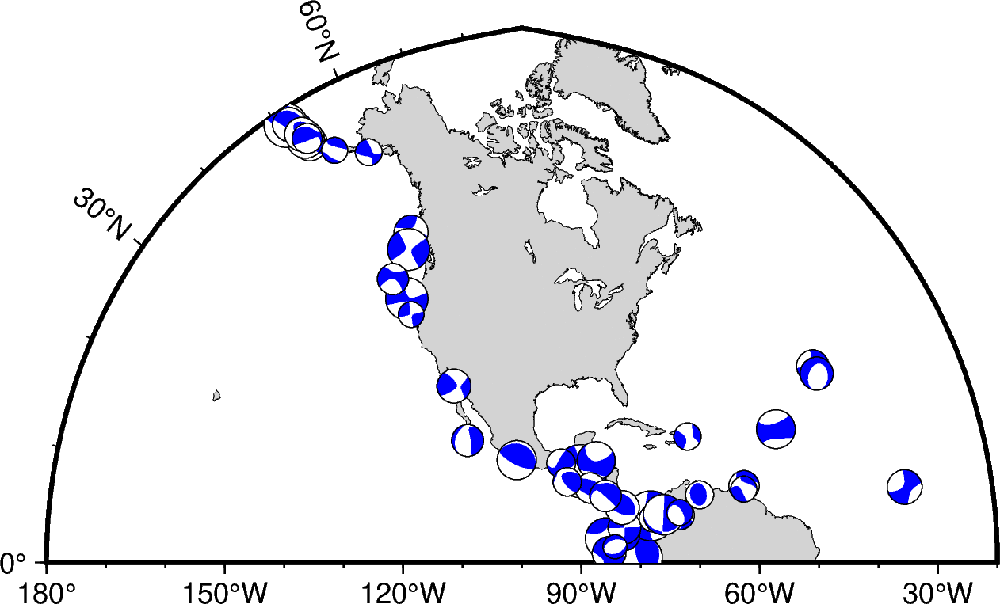

In [8]:
fig = pygmt.Figure()


fig.basemap(region=[minlon, maxlon, minlat, maxlat], projection="Poly/4i", frame=True)

fig.coast(
        land="lightgrey",
        water="white",
        shorelines="0.1p",
        frame="WSNE",
        resolution='h',
        area_thresh=10000
    )

exponent = 16
factor = 10**exponent

#plotting moment tensor sols 
for irow in range(len(df_gcmt)):
#     print(f"{irow}/{len(df_gcmt)-1}")
    m_rr = float(df_gcmt.loc[irow,'m_rr'])/factor
    m_tt = float(df_gcmt.loc[irow,'m_tt'])/factor
    m_pp = float(df_gcmt.loc[irow,'m_pp'])/factor
    m_rt = float(df_gcmt.loc[irow,'m_rt'])/factor
    m_rp = float(df_gcmt.loc[irow,'m_rp'])/factor
    m_tp = float(df_gcmt.loc[irow,'m_tp'])/factor
    evmag = float(df_gcmt.loc[irow,'evmag']) * 0.02
    evdep = float(df_gcmt.loc[irow,'evdep'])
    lat = float(df_gcmt.loc[irow,'evlat'])
    lon = float(df_gcmt.loc[irow,'evlon'])

    # store focal mechanisms parameters in a dict
    focal_mechanism = dict(mrr=m_rr, mtt=m_tt, mff=m_pp, mrt=m_rt, mrf=m_rp, mtf=m_tp, exponent=exponent)
    fig.meca(focal_mechanism, scale=f"{evmag}i", longitude=lon, latitude=lat, depth=evdep,G='blue')

fig.show() 

## 4. Tomographic data on a geographic map

In [9]:
!head -3 dcg_080

 116.777003  20.317177      0.000     0.000
 116.787003  20.317177     -0.005    -0.000
 116.797003  20.317177     -0.010    -0.000


In [10]:
datafile_dcg='dcg_080'

## Read perturbation data
df=pd.read_csv(datafile_dcg,delimiter='\s+', names=['longitude','latitude','pert', 'error'])
lons0=np.array(df['longitude'])
lats0=np.array(df['latitude'])
data=np.array(df['pert'])


coordinates0 = np.column_stack((lons0,lats0))

In [11]:
## Create structured data for plotting
minlon, maxlon = 120., 122.1
minlat, maxlat = 21.8, 25.6
step = 0.01

lons = np.arange(minlon, maxlon, step)
lats = np.arange(minlat, maxlat, step)

## interpolate data on spatial grid
xintrp, yintrp = np.meshgrid(lons, lats)
z1 = griddata(coordinates0, data, (xintrp, yintrp), method='cubic') #cubic interpolation
xintrp = np.array(xintrp, dtype=np.float32)
yintrp = np.array(yintrp, dtype=np.float32)

## xarray dataarray for plotting using pygmt
da = xr.DataArray(z1,dims=("lat", "long"),coords={"long": lons, "lat": lats},)

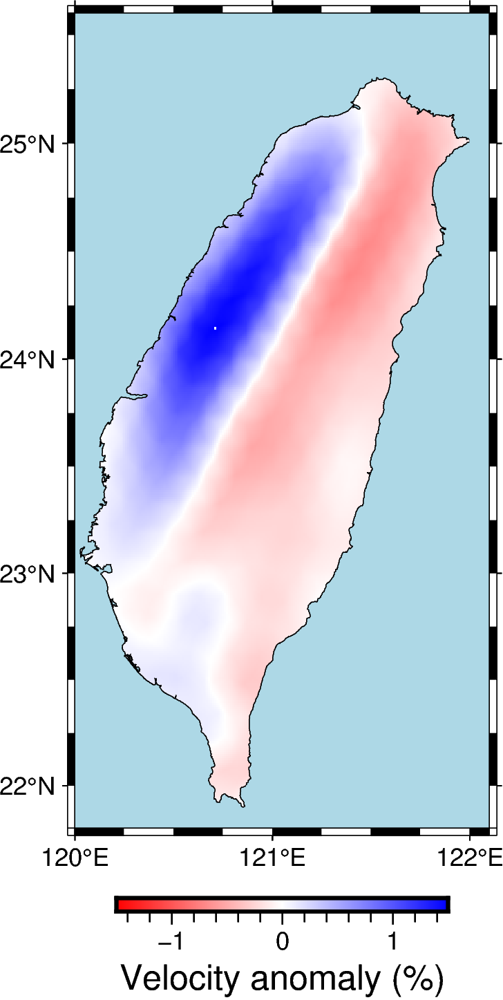

In [12]:
frame =  ["a1f0.25", "WSen"]

# Visualization
fig = pygmt.Figure()

# make color pallets
lim=abs(max(data.min(),data.max()))
# print(f'{data.min():.2f}/{data.max():.2f}')
pygmt.makecpt(
    cmap='red,white,blue',
    # series=f'{data.min()}/{data.max()}/0.01',
    series=f'-{lim}/{lim}/0.01',
    continuous=True
)

#plot high res topography
fig.grdimage(
    region=[minlon, maxlon, minlat, maxlat],
    grid=da,
    projection='M2i',
    interpolation='l'
    )

# plot coastlines
fig.coast(
    region=[minlon, maxlon, minlat, maxlat], 
    shorelines=True,
    water="#add8e6",
    frame=frame,
    area_thresh=1000
    )


## Plot colorbar
# Default is horizontal colorbar
fig.colorbar(
    frame='+l"Velocity anomaly (%)"'
    )
fig.show() 